In [1]:
import numpy as np
from numpy import ma
import pandas as pd
import xarray as xr
from datetime import datetime, timedelta
from dateutil.parser import parse as parse_date
import cv2 as cv
from scipy import ndimage as ndi

import matplotlib.pyplot as plt
from matplotlib import animation
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import cartopy.crs as ccrs

# from utils import io, abi, glm, nexrad
from tobac_flow import io, abi
from tobac_flow.plotting import goes_figure
from tobac_flow.flow import Flow
from tobac_flow.dataloader import goes_dataloader

In [2]:
goes_data_path = '../data/GOES16'
start_date = datetime(2018,6,19,16)
hours = timedelta(hours=4)

bt, wvd, swd = goes_dataloader(start_date, start_date+hours, x0=1300, x1=1600, y0=600, y1=900,
                               satellite=16, product='MCMIP', view='C', mode=[3,4,6], 
                               save_dir=goes_data_path, replicate_path=True, check_download=True, 
                               n_attempts=1, download_missing=True)

In [3]:
bt.shape

(50, 300, 300)

In [4]:
flow_kwargs = {'pyr_scale':0.5, 'levels':5, 'winsize':16, 'iterations':3, 
               'poly_n':5, 'poly_sigma':1.1, 'flags':cv.OPTFLOW_FARNEBACK_GAUSSIAN}

flow = Flow(bt, flow_kwargs=flow_kwargs, smoothing_passes=3)

In [5]:
from tobac_flow.detection import detect_growth_markers
old_wvd_growth, old_growth_markers = detect_growth_markers(flow, wvd)
print('Growth above threshold: area =', np.sum(old_wvd_growth>=0.5))
print('Detected markers: area =', np.sum(old_growth_markers.data!=0))
print('Detected markers: n =', old_growth_markers.data.max())


Growth above threshold: area = 4097
Detected markers: area = 4114
Detected markers: n = 17


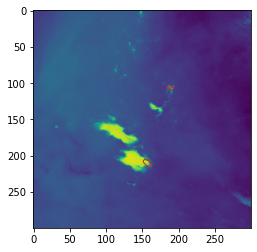

In [6]:
plt.imshow(wvd[24])
plt.contour(old_growth_markers[24], [0.5], colors=['C03'], linewidths=[1])

In [54]:
from tobac_flow.dataset import get_time_diff_from_coord
from tobac_flow.analysis import filter_labels_by_length_and_mask
from tobac_flow.detection import filtered_tdiff, get_curvature_filter

def nan_gaussian_filter(a, *args, propagate_nan=True, **kwargs):
    wh_nan = np.isnan(a)
    
    a0 = a.copy()
    a0[wh_nan] = 0
    
    c = np.ones_like(a)
    c[wh_nan] = 0
    
    a0_gaussian = ndi.gaussian_filter(a0, *args, **kwargs)
    c_gaussian = ndi.gaussian_filter(c, *args, **kwargs)
    c_gaussian[c_gaussian==0] = np.nan
    
    result = a0_gaussian/c_gaussian
    
    if propagate_nan:
        result[wh_nan] = np.nan
    
    return result


def detect_growth_markers_multichannel(flow, wvd, bt, t_sigma=1, overlap=0.5, subsegment_shrink=0,
                                       min_length=3, lower_threshold=0.25, upper_threshold=0.5):

#     wvd_diff_smoothed = nan_gaussian_filter(flow.diff(wvd)/get_time_diff_from_coord(wvd.t)[:,np.newaxis,np.newaxis], 
#                                             (t_sigma, 0, 0))
#     bt_diff_smoothed = nan_gaussian_filter(flow.diff(bt)/get_time_diff_from_coord(bt.t)[:,np.newaxis,np.newaxis], 
#                                             (t_sigma, 0, 0))
    
    wvd_diff_smoothed = filtered_tdiff(flow, flow.diff(wvd)/get_time_diff_from_coord(wvd.t)[:,np.newaxis,np.newaxis])
    bt_diff_smoothed = filtered_tdiff(flow, flow.diff(bt)/get_time_diff_from_coord(bt.t)[:,np.newaxis,np.newaxis])
    
    s_struct = ndi.generate_binary_structure(2,1)[np.newaxis,...]
    wvd_diff_filtered = ndi.grey_opening(wvd_diff_smoothed, footprint=s_struct) * get_curvature_filter(wvd)
    bt_diff_filtered = ndi.grey_opening(bt_diff_smoothed, footprint=s_struct) * get_curvature_filter(bt, direction="positive")
    
    marker_labels = flow.label(ndi.binary_opening(np.logical_or(wvd_diff_filtered>=lower_threshold, bt_diff_filtered<=-lower_threshold), 
                                                  structure=s_struct), 
                               overlap=overlap, subsegment_shrink=subsegment_shrink)
    # marker_labels = flow.label(ndi.binary_opening(marker_regions, structure=s_struct))
    if isinstance(wvd_diff_filtered, xr.DataArray):
        marker_labels = filter_labels_by_length_and_mask(marker_labels, wvd_diff_filtered.data>=upper_threshold, min_length)
    else:
        marker_labels = filter_labels_by_length_and_mask(marker_labels, wvd_diff_filtered>=upper_threshold, min_length)
    if isinstance(bt_diff_filtered, xr.DataArray):
        marker_labels = filter_labels_by_length_and_mask(marker_labels, bt_diff_filtered.data<=-upper_threshold, min_length)
    else:
        marker_labels = filter_labels_by_length_and_mask(marker_labels, bt_diff_filtered<=-upper_threshold, min_length)
#     if isinstance(wvd, xr.DataArray):
#         marker_labels = filter_labels_by_length_and_mask(marker_labels, wvd.data>=-5, min_length)
#     else:
#         marker_labels = filter_labels_by_length_and_mask(marker_labels, wvd>=-5, min_length)

    if isinstance(wvd, xr.DataArray):
        wvd_diff_smoothed = xr.DataArray(wvd_diff_smoothed, wvd.coords, wvd.dims)
        bt_diff_smoothed = xr.DataArray(bt_diff_smoothed, bt.coords, bt.dims)
        marker_labels = xr.DataArray(marker_labels, wvd.coords, wvd.dims)

    return wvd_diff_smoothed, bt_diff_smoothed, marker_labels


In [55]:
wvd_growth, bt_growth, growth_markers = detect_growth_markers_multichannel(flow, wvd, bt, 
                                                                           overlap=0.5, subsegment_shrink=0.25)
print('Growth above threshold: area =', np.sum(wvd_growth.data>=0.5))
print('Detected markers: area =', np.sum(growth_markers.data!=0))
print('Detected markers: n =', growth_markers.data.max())


Growth above threshold: area = 4097
Detected markers: area = 12237
Detected markers: n = 22


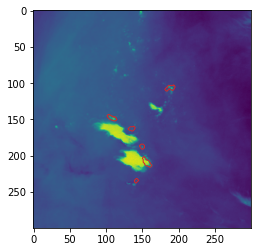

In [56]:
i = 24
plt.imshow(wvd[i])
plt.contour(growth_markers[i], [0.5], colors=['C03'], linewidths=[1])

<ipython-input-57-dafaebd9dd12>:4: UserWarning: No contour levels were found within the data range.
  new_cntr = [plt.contour(growth_markers[0]!=0, [0.5], colors=['b'])]
<ipython-input-57-dafaebd9dd12>:5: UserWarning: No contour levels were found within the data range.
  old_cntr = [plt.contour(old_growth_markers[0]!=0, [0.5], colors=['r'])]
<ipython-input-57-dafaebd9dd12>:19: UserWarning: No contour levels were found within the data range.
  new_cntr[0] = plt.contour(growth_markers[i]!=0, [0.5], colors=['b'])
<ipython-input-57-dafaebd9dd12>:26: UserWarning: No contour levels were found within the data range.
  old_cntr[0] = plt.contour(old_growth_markers[i]!=0, [0.5], colors=['r'])
<ipython-input-57-dafaebd9dd12>:26: UserWarning: No contour levels were found within the data range.
  old_cntr[0] = plt.contour(old_growth_markers[i]!=0, [0.5], colors=['r'])
<ipython-input-57-dafaebd9dd12>:26: UserWarning: No contour levels were found within the data range.
  old_cntr[0] = plt.contour(old

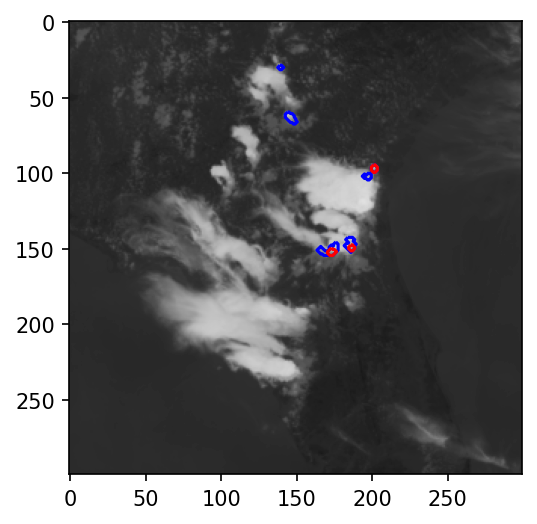

In [57]:
# Animate brightness temperature and masks
fig = plt.figure(dpi=150)
img = plt.imshow(bt[0], vmin=180, vmax=320, cmap='binary') 
new_cntr = [plt.contour(growth_markers[0]!=0, [0.5], colors=['b'])]
old_cntr = [plt.contour(old_growth_markers[0]!=0, [0.5], colors=['r'])]


def init():
    return img, new_cntr, old_cntr

def animate(i):
    img.set_data(bt[i])
    for c in new_cntr:
        for coll in c.collections:
            try:
                coll.remove()
            except:
                pass
    new_cntr[0] = plt.contour(growth_markers[i]!=0, [0.5], colors=['b'])
    for c in old_cntr:
        for coll in c.collections:
            try:
                coll.remove()
            except:
                pass
    old_cntr[0] = plt.contour(old_growth_markers[i]!=0, [0.5], colors=['r'])
    return img, new_cntr, old_cntr

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=48, 
                               interval=20, blit=False)

from IPython.display import HTML, Image, display
HTML(anim.to_jshtml())

In [58]:
# Watershed anvil regions connected to growth markers
from tobac_flow.detection import edge_watershed
from tobac_flow.analysis import filter_labels_by_length_and_mask

inner_watershed = edge_watershed(flow, wvd-swd, growth_markers!=0, -5, -15)
inner_labels = filter_labels_by_length_and_mask(flow.label(inner_watershed, overlap=0.75, subsegment_shrink=0.25), 
                                                growth_markers.data!=0, 3)
print('Detected anvils: area =', np.sum(inner_labels!=0))
print('Detected anvils: n =', inner_labels.max())

outer_watershed = edge_watershed(flow, wvd+swd, inner_labels, 0, -10)
print('Detected thin anvils: area =', np.sum(outer_watershed!=0))


Detected anvils: area = 101907
Detected anvils: n = 11
Detected thin anvils: area = 161165


<ipython-input-59-0a64f689a06b>:4: UserWarning: No contour levels were found within the data range.
  cntr = [plt.contour(outer_watershed[0], [0.5], colors=['C00'], linewidths=[1]),
<ipython-input-59-0a64f689a06b>:5: UserWarning: No contour levels were found within the data range.
  plt.contour(inner_watershed[0], [0.5], colors=['C01'], linewidths=[1]),
<ipython-input-59-0a64f689a06b>:6: UserWarning: No contour levels were found within the data range.
  plt.contour(growth_markers[0], [0.5], colors=['C03'], linewidths=[1])]
<ipython-input-59-0a64f689a06b>:19: UserWarning: No contour levels were found within the data range.
  cntr[0] = plt.contour(outer_watershed[i], [0.5], colors=['C00'], linewidths=[1])
<ipython-input-59-0a64f689a06b>:20: UserWarning: No contour levels were found within the data range.
  cntr[1] = plt.contour(inner_watershed[i], [0.5], colors=['C01'], linewidths=[1])
<ipython-input-59-0a64f689a06b>:21: UserWarning: No contour levels were found within the data range.
  

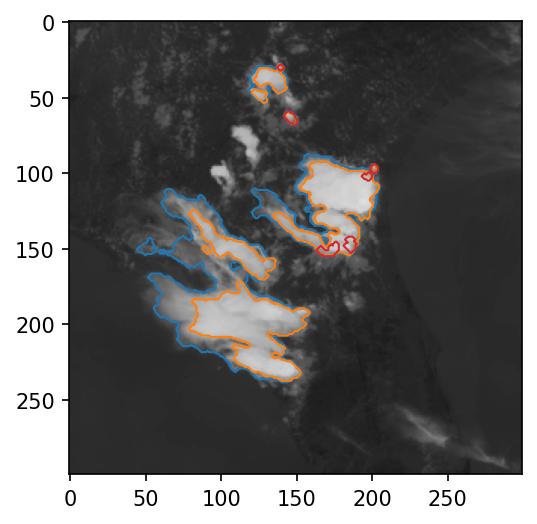

In [59]:
# Animate brightness temperature and masks
fig = plt.figure(dpi=150)
img = plt.imshow(bt[0], vmin=180, vmax=320, cmap='binary') 
cntr = [plt.contour(outer_watershed[0], [0.5], colors=['C00'], linewidths=[1]),
        plt.contour(inner_watershed[0], [0.5], colors=['C01'], linewidths=[1]),
        plt.contour(growth_markers[0], [0.5], colors=['C03'], linewidths=[1])]

def init():
    return img, cntr

def animate(i):
    img.set_data(bt[i])
    for c in cntr:
        for coll in c.collections:
            try:
                coll.remove()
            except:
                pass
    cntr[0] = plt.contour(outer_watershed[i], [0.5], colors=['C00'], linewidths=[1])
    cntr[1] = plt.contour(inner_watershed[i], [0.5], colors=['C01'], linewidths=[1])
    cntr[2] = plt.contour(growth_markers[i], [0.5], colors=['C03'], linewidths=[1])
    
    return img, cntr

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=48, 
                               interval=20, blit=False)

from IPython.display import HTML, Image, display
HTML(anim.to_jshtml())